### The code in this notebook cleans unclear images.

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa
from keras.layers import Conv2D,BatchNormalization,MaxPooling2D,Flatten,Dense,Conv2DTranspose,UpSampling2D,Dropout
import matplotlib.pyplot as plt
import random
import os
from pathlib import Path
from sklearn.model_selection import train_test_split

In [2]:
cd = Path.cwd()
datasets_dir = os.path.join(cd,r'OneDrive\Desktop\Datasets')

def get_image_paths(directory):
    image_paths = []
    for image_path in os.listdir(directory):
        if 'jpg' in image_path:
            image_paths.append(os.path.join(directory,image_path))
    image_paths = sorted(image_paths)
    return image_paths

### The data consist of images in several categories, including people, animals, plants, and vehicles. The directories containing the images are printed in the cell below.

In [3]:
directories = [
    r'celeb_a\img_align_celeba\img_align_celeba',
    r'Cats-and-Dogs\Cat',
    r'Cats-and-Dogs\Dog'
]

directories = [os.path.join(datasets_dir,d) for d in directories]

natural_images_dir = os.path.join(datasets_dir,r'natural-images\natural_images')
for thing in os.listdir(natural_images_dir):
    directories.append(os.path.join(natural_images_dir,thing))
    
for d in directories:
    print(d[41:])

celeb_a\img_align_celeba\img_align_celeba
Cats-and-Dogs\Cat
Cats-and-Dogs\Dog
natural-images\natural_images\airplane
natural-images\natural_images\car
natural-images\natural_images\cat
natural-images\natural_images\dog
natural-images\natural_images\flower
natural-images\natural_images\fruit
natural-images\natural_images\motorbike
natural-images\natural_images\person


In [4]:
all_image_paths = []

for directory in directories:
    all_image_paths += get_image_paths(directory)
    
bad_paths = [
    os.path.join(directories[1],'10404.jpg'),
    os.path.join(directories[1],'4351.jpg'),
    os.path.join(directories[1],'666.jpg'),
    os.path.join(directories[2],'11233.jpg'),
    os.path.join(directories[2],'11702.jpg'),
    os.path.join(directories[2],'11912.jpg'),
    os.path.join(directories[2],'2317.jpg'),
    os.path.join(directories[2],'2494.jpg'),
    os.path.join(directories[2],'9500.jpg')
]

for bad_path in bad_paths:
    all_image_paths.remove(bad_path)
    
train_image_paths,test_image_paths = train_test_split(all_image_paths,
                                                     test_size=.04,
                                                     random_state=3)

print('There are {} training images and {} test images'.format(len(train_image_paths),len(test_image_paths)))

There are 225109 training images and 9380 test images


### The following functions constitute a pipeline that extracts images from the directories, resizes them to a uniform height and width, and adds the necessary augmentation. Each image is made noisy, blurry, or both.

In [5]:
height = 218
width = 178


def extract_image(path,dtype=tf.float16,resize=True):
    
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image,expand_animations=False)
    image = tf.image.convert_image_dtype(image,dtype=dtype)
    if tf.shape(image)[-1] != 3:
        image = tf.reduce_mean(image,axis=-1)
        image = tf.stack([image,image,image],axis=-1)
    if resize:
        image = tf.image.resize(image,(height,width))
    
    return image


def add_noise(image):
    
    noise_param = tf.random.uniform((1,),7,10)
    noise = tf.random.normal(shape=(height,width,3),mean=1,stddev=1)/noise_param
    noisy_image = tf.add(image,noise)
    noisy_image = tf.clip_by_value(noisy_image,0,1)
    
    return noisy_image


@tf.function(reduce_retracing=True)
def blur_image(image):
    
    t = np.random.uniform(2.5,3.1)
    blurred_image = tfa.image.gaussian_filter2d(image,(7,7),t)
    blurred_image = tf.clip_by_value(blurred_image,0,1)
    
    return blurred_image


def random_flip(image):
    
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    return image


def blur_and_noise(image):
    
    altered_image = add_noise(image)
    altered_image = blur_image(altered_image)
    
    return altered_image


def random_alter_image(image):
    
    n = tf.random.categorical([[.4,.4,.2]],num_samples=1)
    n = tf.squeeze(n)
    if n == 0:
        return blur_image(image)
    elif n == 1:
        return add_noise(image)
    else:
        return blur_and_noise(image)

### Some examples of images before and after they're altered. 

            Clean Images:                                 Altered Images:


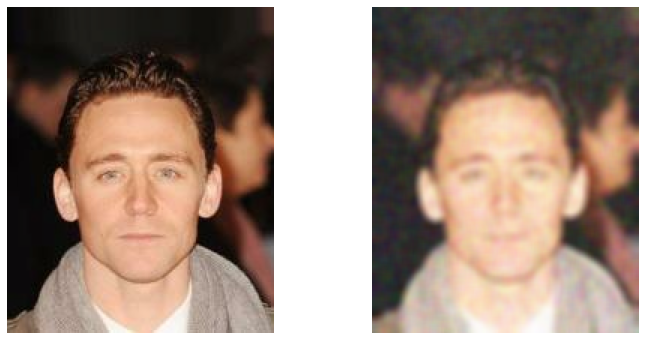

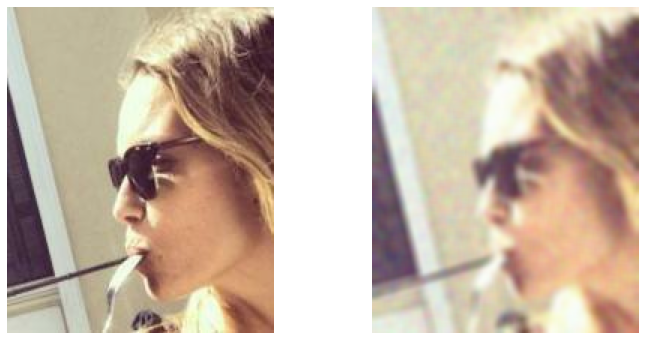

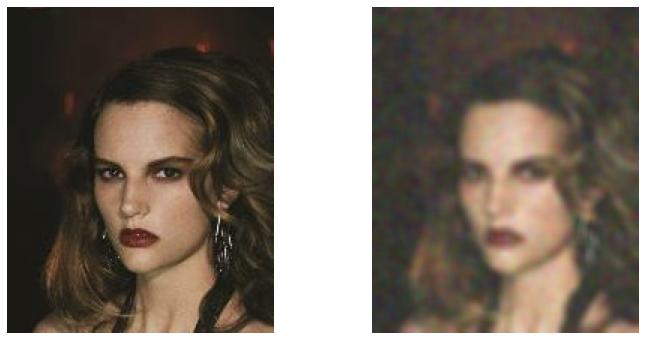

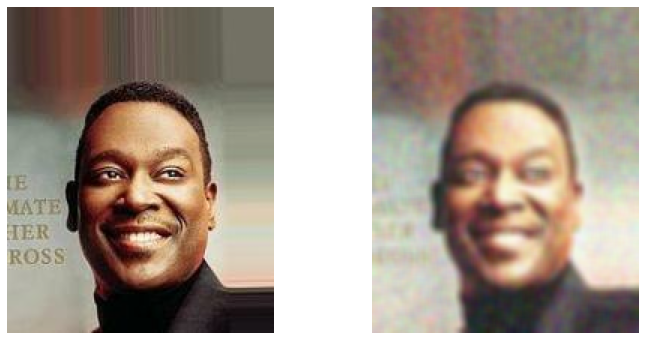

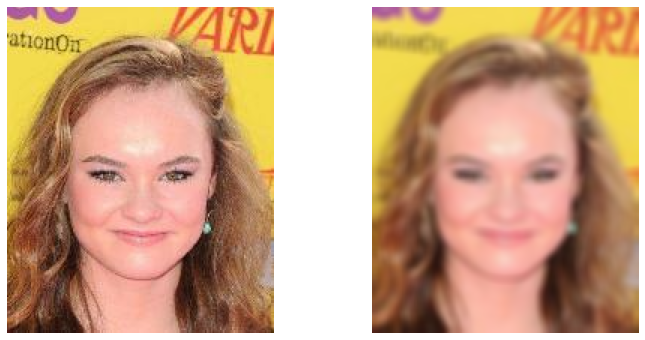

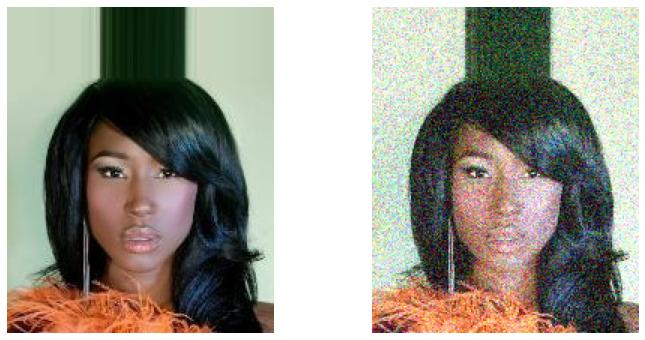

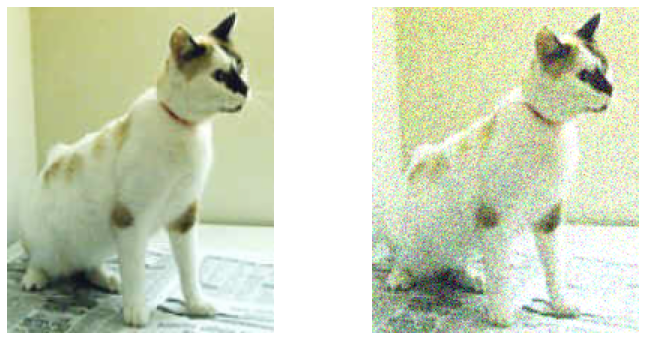

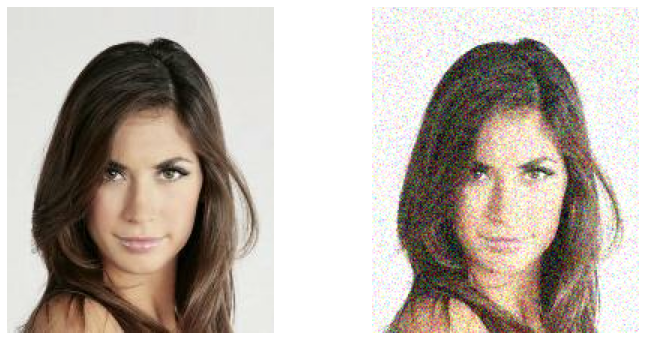

In [6]:
print(' '*12+'Clean Images:'+' '*33+'Altered Images:')
for _ in range(8):
    path = random.choice(train_image_paths)
    image = extract_image(path)
    altered_image = random_alter_image(image)
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(altered_image)
    plt.axis('off')
    plt.show()

### The following function creates a TensorFlow  Dataset object that creates the pipeline using the above functions.

In [8]:
batch_size = 64

def make_dataset(paths,train=True,batch_size=batch_size):
    
    random.shuffle(paths)
    dataset = tf.data.Dataset.from_tensor_slices(paths)
    dataset = dataset.map(extract_image)
    if train:
        dataset = dataset.map(random_flip)
    dataset = dataset.map(lambda image: (random_alter_image(image),image))
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    return dataset


train_dataset = make_dataset(train_image_paths)
test_dataset = make_dataset(test_image_paths,train=False)

### The loss function the model uses is based on the structural similarity index measure (SSIM), a metric that measures the similarity between two images based on the means, variances, and covariances of the two images' pixel values. Two identical images will have an SSIM of 1, and two completely unalike images will have an SSIM of 0.
### The model tries to minimize 1- SSIM, which effectively maximizes SSIM.

In [9]:
class SSIMLoss(keras.losses.Loss):
    
    def __init__(self):
        super(SSIMLoss,self).__init__()

    def call(self,y_true,y_pred):
        return 1 - tf.image.ssim(y_true,y_pred,max_val=1)

### The model itself is an autoencoder that uses a u-net architecture. The first half is an encoder that uses convolutional layers to encode each image in a 2x2x4096 tensor, and the second half is a decoder that reconstructs the image without the augmentation. Each layer from the encoder is saved and added to a corresponding equally-sized layer in the second half. These skip connections prevent vanishing gradients by allowing the data to take multiple paths through the model, as well as by increasing the values of the gradients through addition.
### The inputs are the blurry/noisy images, and the outputs are the original clean images. The model learns to turn the former into the latter.

In [10]:
filters = 32
dropout_rate = .1

inputs = keras.Input(shape=(height,width,3))
X = Conv2D(filters,(3,3),activation='selu',padding='same')(inputs)

saved_layers = []
for i in range(4):
    X = Conv2D(filters,(5,3),activation='selu',strides=2)(X)
    saved_layers.append(X)
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)
    filters *= 2
    
for i in range(4):
    X = Conv2D(filters,(3,3),activation='selu')(X)
    saved_layers.append(X)
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)
    filters *= 2
    
saved_layers.pop()
saved_layers.reverse()
    
filters /= 4
for i in range(4):
    X = Conv2DTranspose(filters,(3,3),activation='selu')(X)
    X += saved_layers[i]
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)
    filters /= 2
    
for i in range(2):
    X = Conv2DTranspose(filters,(5,3),activation='selu',strides=2)(X)
    X = Conv2DTranspose(filters,(2,1),activation='selu')(X)
    X = X + saved_layers[i+4]
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)
    filters /= 2
    
for i in range(2):
    X = Conv2DTranspose(filters,(5,3),activation='selu',strides=2)(X)
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)

X = Conv2DTranspose(3,(2,4),activation='selu')(X)
output = Conv2D(3,(1,1),activation='sigmoid')(X)
    
autoencoder = keras.Model(inputs=inputs,
                         outputs=output)


ssim_loss = SSIMLoss()
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
autoencoder.compile(loss=ssim_loss,
                   optimizer=optimizer,
                   metrics='mae')

autoencoder.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 218, 178, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 218, 178, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 107, 88, 32)  15392       ['conv2d[0][0]']                 
                                                                                              

### The model was trained for 50+ hours on a GPU, and the weights are uploaded here. The model is then tested on a small subset of both the training and test data, with a table below giving the structural similarity and mean absolute error of both datasets.

In [11]:
weights_path = os.path.join(datasets_dir,r'weights\autoencoder_weights.h5')
autoencoder.load_weights(weights_path)

sample_size = 512
sample_train_dataset = make_dataset(random.sample(train_image_paths,sample_size),train=False)
sample_test_dataset = make_dataset(random.sample(test_image_paths,sample_size),train=False)

train_ssim,train_mae = autoencoder.evaluate(sample_train_dataset,verbose=False)
train_ssim = 1 - train_ssim

test_ssim,test_mae = autoencoder.evaluate(sample_test_dataset,verbose=False)
test_ssim = 1 - test_ssim

ssim = [train_ssim,test_ssim]
mae = [train_mae,test_mae]

metrics = pd.DataFrame({'Structural Similarity':ssim,'Mean Absolute Error':mae},
                       index=['Training Data','Test Data']).round(4)

display(metrics)

,Structural Similarity,Mean Absolute Error
Training Data,0.8730,0.0383
Test Data,0.8701,0.0407


### Here the model is tested on a few of the training images:

Cleaning training images:


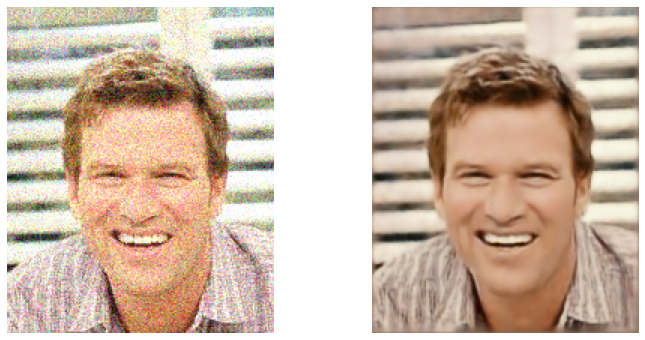

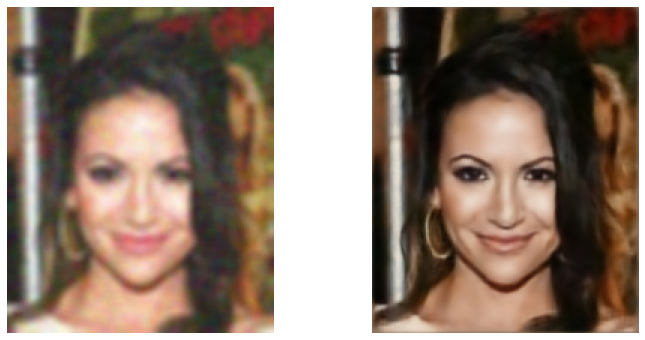

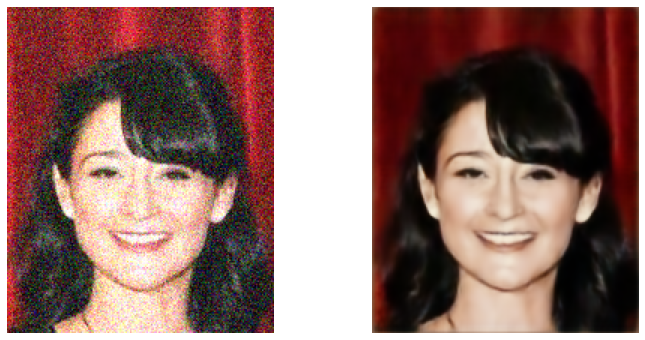

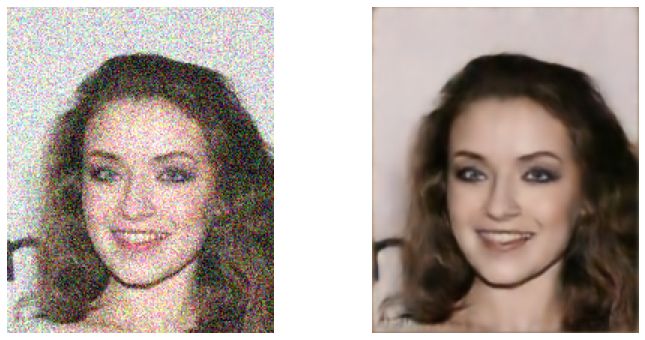

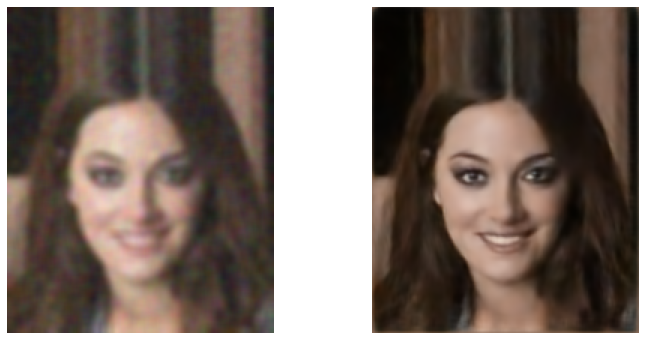

In [12]:
sample_image_paths = random.sample(train_image_paths,5)

print('Cleaning training images:')
for path in sample_image_paths:

    image = extract_image(path,dtype=tf.float32,resize=False)
    original_shape = tf.shape(image)
    image = tf.image.resize(image,(height,width))
    altered_image = random_alter_image(image)
    cleaned_image = tf.squeeze(autoencoder(tf.expand_dims(altered_image,0)))
    altered_image = tf.image.resize(altered_image,(original_shape[0],original_shape[1]))
    cleaned_image = tf.image.resize(cleaned_image,(original_shape[0],original_shape[1]))
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.imshow(altered_image)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(cleaned_image)
    plt.axis('off')
    plt.show()

### And here it's tested on images from the test set:

Cleaning testing images:


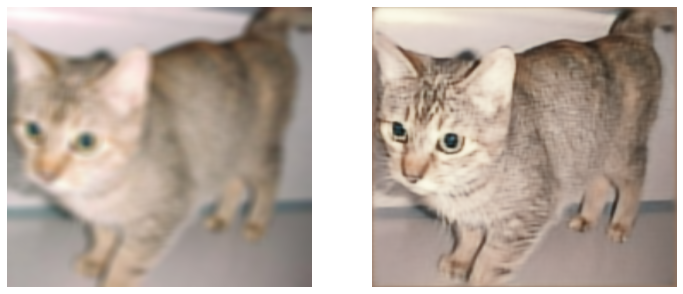

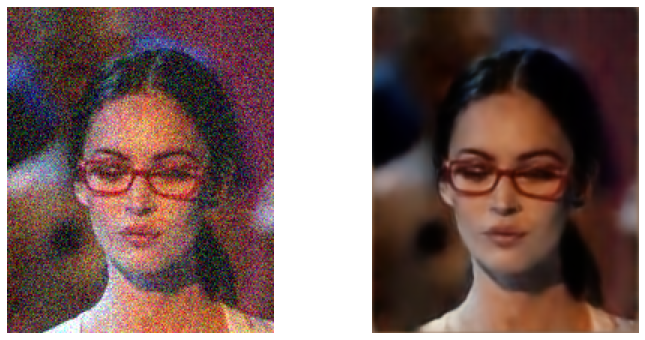

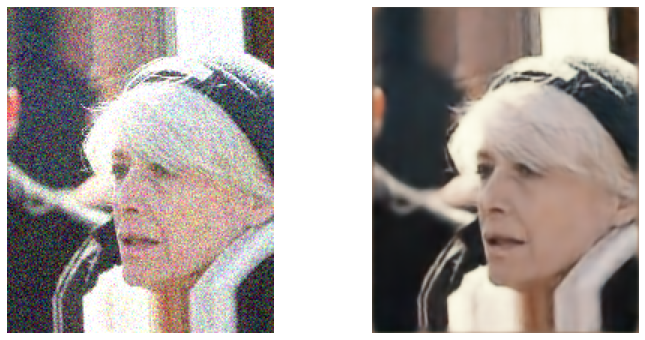

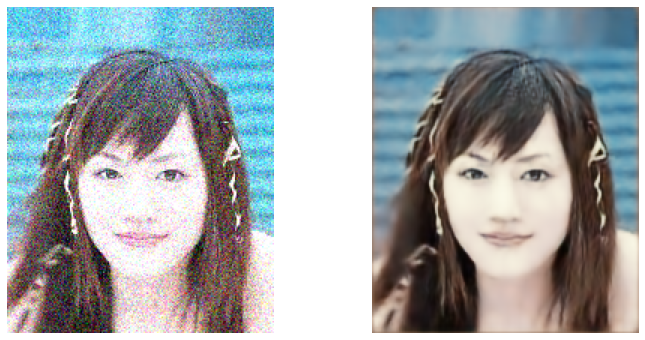

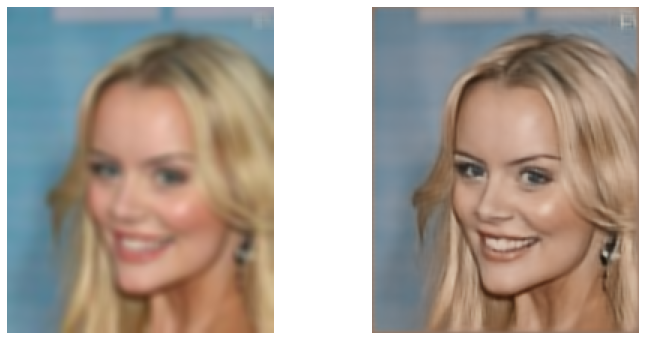

...

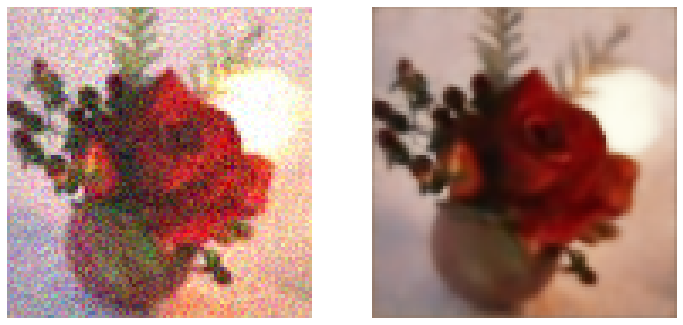

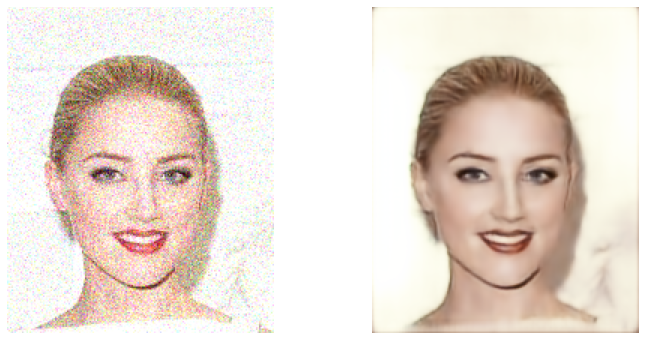

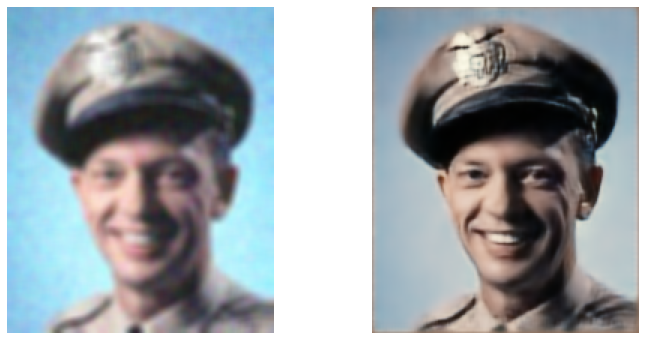

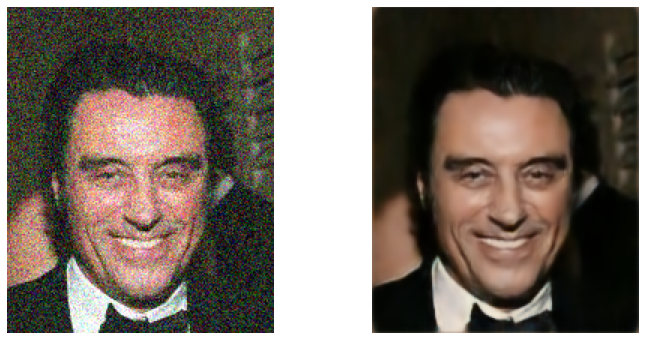

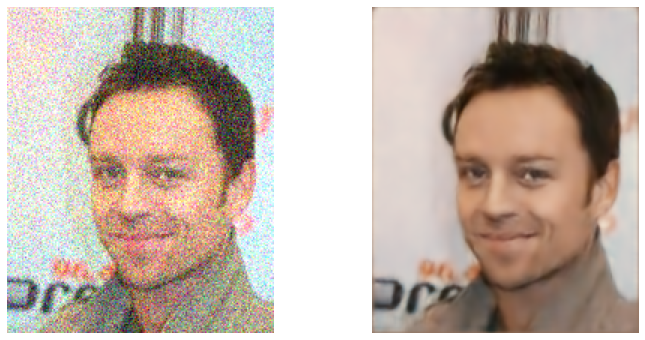

In [13]:
sample_image_paths = random.sample(test_image_paths,25)

print('Cleaning testing images:')
for path in sample_image_paths:
    image = extract_image(path,dtype=tf.float32,resize=False)
    original_shape = tf.shape(image)
    image = tf.image.resize(image,(height,width))
    altered_image = random_alter_image(image)
    cleaned_image = tf.squeeze(autoencoder(tf.expand_dims(altered_image,0)))
    altered_image = tf.image.resize(altered_image,(original_shape[0],original_shape[1]))
    cleaned_image = tf.image.resize(cleaned_image,(original_shape[0],original_shape[1]))
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.imshow(altered_image)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(cleaned_image)
    plt.axis('off')
    plt.show()